In [24]:
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf
import keras

from utilities.DatasetUtils import (
    create_sequences,
    display_audio,
    midi_to_notes,
    notes_to_midi,
    plot_distributions,
    plot_piano_roll,
    rmse
)
from utilities.ModelUtils import (non_neg_mse, predict_next_note)

seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

# Sampling rate for audio playback
_SAMPLING_RATE = 16000

# <center>Retrieve the Data</center>

In [25]:
data_dir = pathlib.Path('data/maestro-v2.0.0')
filenames = glob.glob(str(data_dir/'*/*.mid*'))
print('Number of files:', len(filenames))
sample_file = filenames[2]
sample_file

Number of files: 1282


'data\\maestro-v2.0.0\\2004\\MIDI-Unprocessed_SMF_02_R1_2004_01-05_ORIG_MID--AUDIO_02_R1_2004_08_Track08_wav.midi'

In [26]:
pm = pretty_midi.PrettyMIDI(sample_file)

display_audio(pm)

# <center>Process a midi file</center>

In [27]:
print('Number of instruments:', len(pm.instruments))
instrument = pm.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
print('Instrument name:', instrument_name)

Number of instruments: 1
Instrument name: Acoustic Grand Piano


# <center>Extract Notes</center>

In [28]:
for i, note in enumerate(instrument.notes[:10]):
  note_name = pretty_midi.note_number_to_name(note.pitch)
  duration = note.end - note.start
  print(f'{i}: pitch={note.pitch}, note_name={note_name},'
        f' duration={duration:.4f}')

0: pitch=38, note_name=D2, duration=0.3042
1: pitch=45, note_name=A2, duration=0.1417
2: pitch=53, note_name=F3, duration=0.0906
3: pitch=62, note_name=D4, duration=0.2042
4: pitch=67, note_name=G4, duration=0.0677
5: pitch=74, note_name=D5, duration=0.2031
6: pitch=53, note_name=F3, duration=0.1802
7: pitch=50, note_name=D3, duration=0.1229
8: pitch=76, note_name=E5, duration=0.1604
9: pitch=69, note_name=A4, duration=0.1760


In [29]:
raw_notes = midi_to_notes(sample_file)
raw_notes.head()

,pitch,start,end,step,duration
0,38,1.022917,1.327083,0.000000,0.304167
1,45,1.270833,1.412500,0.247917,0.141667
2,53,1.496875,1.587500,0.226042,0.090625
3,62,1.852083,2.056250,0.355208,0.204167
4,74,2.110417,2.313542,0.258333,0.203125


# <center>Plot piano roll</center>

In [30]:
get_note_names = np.vectorize(pretty_midi.note_number_to_name)
sample_note_names = get_note_names(raw_notes['pitch'])
sample_note_names[:10]

array(['D2', 'A2', 'F3', 'D4', 'D5', 'G4', 'F3', 'E5', 'A4', 'D3'],
      dtype='<U3')

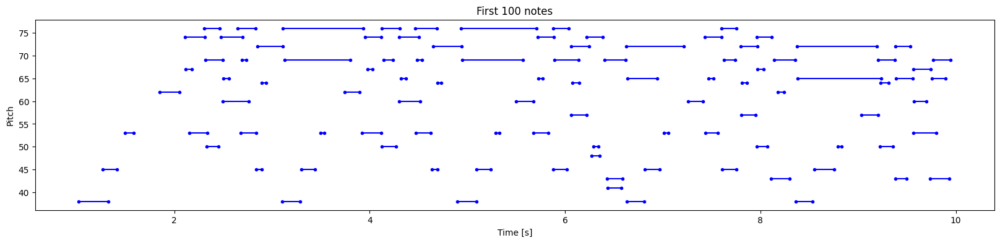

In [31]:
plot_piano_roll(raw_notes, count=100)

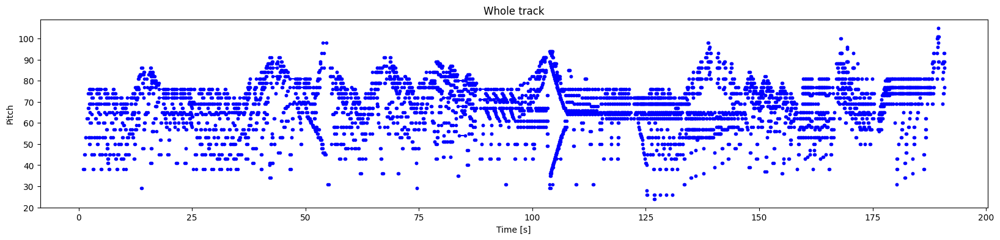

In [32]:
plot_piano_roll(raw_notes)

# <center>Plot Distributions</center>

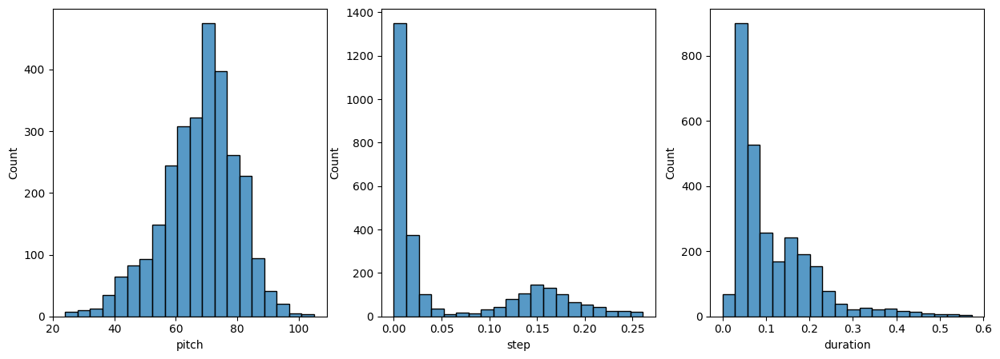

In [33]:
plot_distributions(raw_notes)

# <center>Create and save a new MIDI file from notes</center>

In [34]:
# example_file = 'example.midi'
# example_pm = notes_to_midi(
#     raw_notes, out_file=example_file, instrument_name=instrument_name)
# display_audio(example_pm)

# <center>Create the Training Set </center>

In [35]:
num_files = 256
all_notes = []
for f in filenames[:num_files]:
    notes = midi_to_notes(f)
    all_notes.append(notes)

all_notes = pd.concat(all_notes)
n_notes = len(all_notes)
print('Number of notes parsed:', n_notes)
key_order = ['pitch', 'start', 'end', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1)
notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec

Number of notes parsed: 1705037


TensorSpec(shape=(5,), dtype=tf.float64, name=None)

## <center>Create Dataset</center>

In [36]:
seq_length = 128
vocab_size = 128
seq_ds = create_sequences(notes_ds, key_order, seq_length, vocab_size)
seq_ds.element_spec

for seq, target in seq_ds.take(1):
  print('sequence shape:', seq.shape)
  print('sequence elements (first 10):', seq[0: 10])
  print()
  print('target:', target)

sequence shape: (128, 5)
sequence elements (first 10): tf.Tensor(
[[7.10000000e+01 1.09270833e+00 1.18958333e+00 0.00000000e+00
  9.68750000e-02]
 [5.50000000e+01 1.27916667e+00 1.49687500e+00 1.86458333e-01
  2.17708333e-01]
 [7.10000000e+01 1.28854167e+00 1.79375000e+00 9.37500000e-03
  5.05208333e-01]
 [5.90000000e+01 1.46354167e+00 1.63125000e+00 1.75000000e-01
  1.67708333e-01]
 [6.20000000e+01 1.63333333e+00 1.75312500e+00 1.69791667e-01
  1.19791667e-01]
 [7.20000000e+01 1.78645833e+00 1.82812500e+00 1.53125000e-01
  4.16666667e-02]
 [6.70000000e+01 1.80312500e+00 2.00000000e+00 1.66666667e-02
  1.96875000e-01]
 [7.40000000e+01 1.98333333e+00 2.09791667e+00 1.80208333e-01
  1.14583333e-01]
 [5.70000000e+01 1.98333333e+00 2.52291667e+00 0.00000000e+00
  5.39583333e-01]
 [7.20000000e+01 2.03750000e+00 2.10625000e+00 5.41666667e-02
  6.87500000e-02]], shape=(10, 5), dtype=float64)

target: {'pitch': <tf.Tensor: shape=(), dtype=float64, numpy=73.0>, 'start': <tf.Tensor: shape=(), dt

In [37]:
batch_size = 64
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [53]:
input_shape = (seq_length, 5)
learning_rate = 0.001

inputs = tf.keras.Input(input_shape)
x = keras.layers.Bidirectional(keras.layers.LSTM(128, return_sequences=True))(inputs)
x = keras.layers.Dropout(.2)(x)
x = keras.layers.Bidirectional(keras.layers.LSTM(64))(x)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'start': tf.keras.layers.Dense(1, activation='relu', name='start')(x),
  'end': tf.keras.layers.Dense(1, activation='relu', name='end')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'start': rmse,
      'end': rmse,
      'step': non_neg_mse,
      'duration': non_neg_mse,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate, clipvalue=.5)

model.compile(
  loss=loss,
  loss_weights={
    'pitch': .95,
    'start': .35,
    'end': .35,
    'step': 1.0,
    'duration': 1.0
  },
  optimizer=optimizer
)

model.summary()


Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 128, 5)]     0           []                               
                                                                                                  
 bidirectional_7 (Bidirectional  (None, 128, 256)    137216      ['input_5[0][0]']                
 )                                                                                                
                                                                                                  
 dropout_4 (Dropout)            (None, 128, 256)     0           ['bidirectional_7[0][0]']        
                                                                                                  
 bidirectional_8 (Bidirectional  (None, 128)         164352      ['dropout_4[0][0]']        

In [54]:
history = model.fit(train_ds, epochs=2)

Epoch 1/2


ValueError: in user code:

    File "c:\tools\miniconda3\lib\site-packages\keras\engine\training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "c:\tools\miniconda3\lib\site-packages\keras\engine\training.py", line 1146, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\tools\miniconda3\lib\site-packages\keras\engine\training.py", line 1135, in run_step  **
        outputs = model.train_step(data)
    File "c:\tools\miniconda3\lib\site-packages\keras\engine\training.py", line 998, in train_step
        return self.compute_metrics(x, y, y_pred, sample_weight)
    File "c:\tools\miniconda3\lib\site-packages\keras\engine\training.py", line 1092, in compute_metrics
        self.compiled_metrics.update_state(y, y_pred, sample_weight)
    File "c:\tools\miniconda3\lib\site-packages\keras\engine\compile_utils.py", line 577, in update_state
        self.build(y_pred, y_true)
    File "c:\tools\miniconda3\lib\site-packages\keras\engine\compile_utils.py", line 483, in build
        self._metrics = tf.__internal__.nest.map_structure_up_to(

    ValueError: The two structures don't have the same sequence length. Input structure has length 5, while shallow structure has length 3.


In [46]:
# model = keras.models.load_model(r'C:\Users\samue\Documents\Applied Data Science\INFO-H518 Deep Learning\Project', custom_objects={'rmse':rmse, 'non_neg_mse':non_neg_mse})

In [42]:
model.save(r'C:\Users\samue\Documents\Applied Data Science\INFO-H518 Deep Learning\Project\models\1')

INFO:tensorflow:Assets written to: C:\Users\samue\Documents\Applied Data Science\INFO-H518 Deep Learning\Project\models\0\assets


INFO:tensorflow:Assets written to: C:\Users\samue\Documents\Applied Data Science\INFO-H518 Deep Learning\Project\models\0\assets


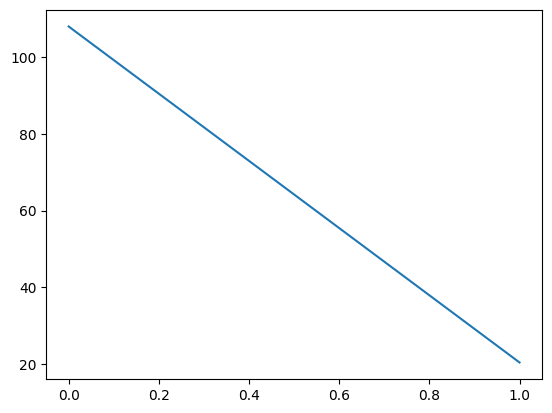

In [43]:

import matplotlib.pyplot as plt
plt.plot(history.epoch, history.history['loss'], label='total loss')
plt.show()


In [44]:
temperature = 1.0
num_predictions = 128

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
print(sample_notes[:1])
input_notes = sample_notes[:seq_length]

generated_notes = []
for _ in range(num_predictions):
  pitch, start, end, step, duration = predict_next_note(input_notes, model, temperature)
  input_note = (pitch, start, end, step, duration)
  generated_notes.append((input_note))
  input_notes = np.delete(input_notes, 0, axis=0)
  input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)

generated_notes = pd.DataFrame(generated_notes, columns=[key_order])

[[38.          1.02291667  1.32708333  0.          0.30416667]]
1/1 [==============================] - 0s 39ms/step


In [48]:
out_file = './data/generated_files/output_7.mid'
out_pm = notes_to_midi(generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)


In [49]:
import matplotlib.pyplot as plt
def plot_piano_rolls(notes: pd.DataFrame, count = None):
	if count:
		title = f'First {count} notes'
	else:
		title = f'Whole track'
		count = len(notes['pitch'])
	plt.figure(figsize=(20, 4))
	plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0).squeeze()
	plot_start_stop = np.stack([notes['start'], notes['end']], axis=0).squeeze()
	print(plot_start_stop.shape)
	plt.plot(
		plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker="."
	)
	plt.xlabel('Time [s]')
	plt.ylabel('Pitch')
	_ = plt.title(title)
	return plt.show()

(2, 128)


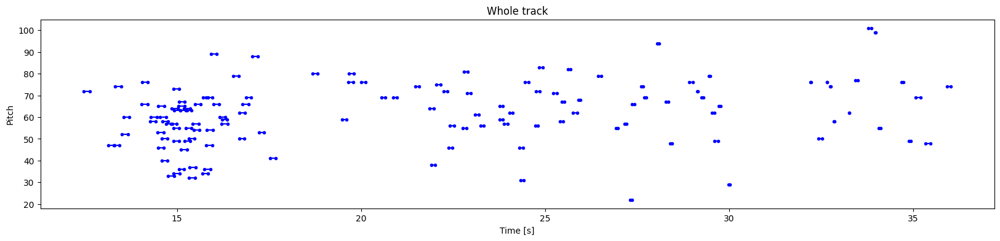

In [50]:
plot_piano_rolls(generated_notes)


In [22]:
data_dir = pathlib.Path('data/generated_files')
filenames = glob.glob(str(data_dir/'*.mid*'))
print('Number of files:', len(filenames))
sample_file = filenames[2]
sample_file

pm = pretty_midi.PrettyMIDI(sample_file)

display_audio(pm)

Number of files: 7


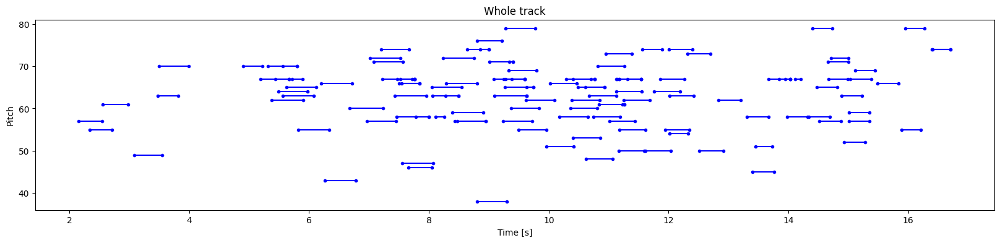

In [23]:
blah = midi_to_notes(sample_file)

plot_piano_roll(blah)